# 🐶 End-to-End Multi-class Dog Breed Classification


This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.15 and TensorFlow Hub.  

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When i am sitting at a cafe and take a photo of a dog, i want to know what breed of dog it is.

## 2. Data

The data we are using is from Kaggle's dog breed Identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data


## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:

* We're dealing with images (unstructured data) so it's probably best to use deep learning / transfer learning.
* There are 120 breeds of dogs (This means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).


In [1]:
# Unzipping the uploaded data into Google drive
#!unzip "drive/MyDrive/Colab Notebooks/Dog vision/Dataset/dog-breed-identification.zip" -d "drive/MyDrive/Colab Notebooks/Dog vision/Dataset/"

### Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we are using a GPU ✅

In [2]:
# importing tensorflow into colab

import tensorflow as tf
import tensorflow_hub as hub
print('TF version', tf.__version__)
print("tf hub version:", hub.__version__)

# Check for GPU availability

print('GPU', 'available (YESSS!!!)' if tf.config.list_physical_devices('GPU') else 'not avaliable :(')

TF version 2.15.0
tf hub version: 0.16.0
GPU available (YESSS!!!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we will be doing first. Turning or images into Tensors (numerical representations).

Let's start by accessing our data and checking our labels

In [3]:
# Checkout the labels of our data

import pandas as pd

labels_csv = pd.read_csv('drive/MyDrive/Colab Notebooks/Dog vision/Dataset/labels.csv')

print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

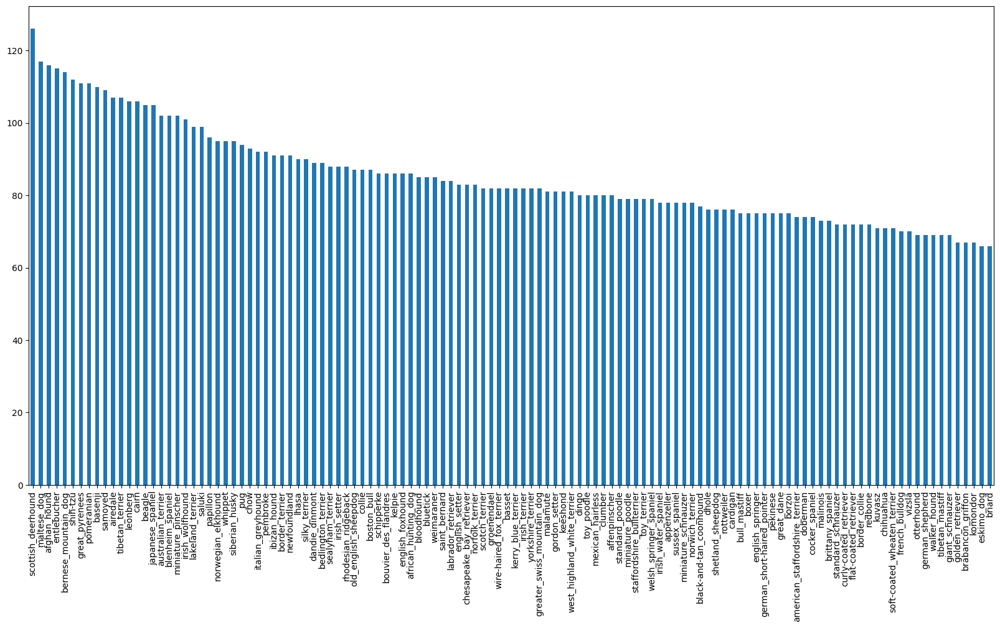

In [5]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [6]:
# Finding median
labels_csv.breed.value_counts().median()

82.0

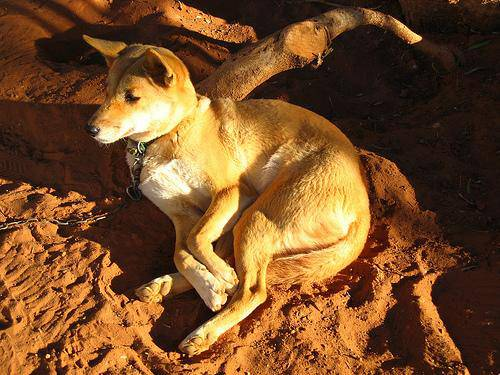

In [7]:
# Let's view an image.. It's one way to view an image
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Creating pathnames from image ID's
fileNames = ["drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/" + fname +".jpg" for fname in labels_csv['id']]

# Checking first 10
fileNames[:10]

['drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# It will list all the files present in a directory... currently just showing first 5 as we use slicing.
import os
os.listdir("drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/")[:5]

['db906850433ed033317baa34a0905fb4.jpg',
 'dd694fe7f5b46a6dd7c545d31004e1f6.jpg',
 'de33550ba1323a0376fc1292a1d25d71.jpg',
 'e86a88391d017cc3807cc9653a4a7290.jpg',
 'de8c32b71a43eef41eb1af93c1baf150.jpg']

In [11]:
# Check whether number of filenames matches with the actual image files

import os

if len(os.listdir("drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/")) == len(fileNames):
  print("Filename match actual amount of files!!! Proceed")
else:
  print("Filenames do not match actual amount of files, check target directory")

Filename match actual amount of files!!! Proceed


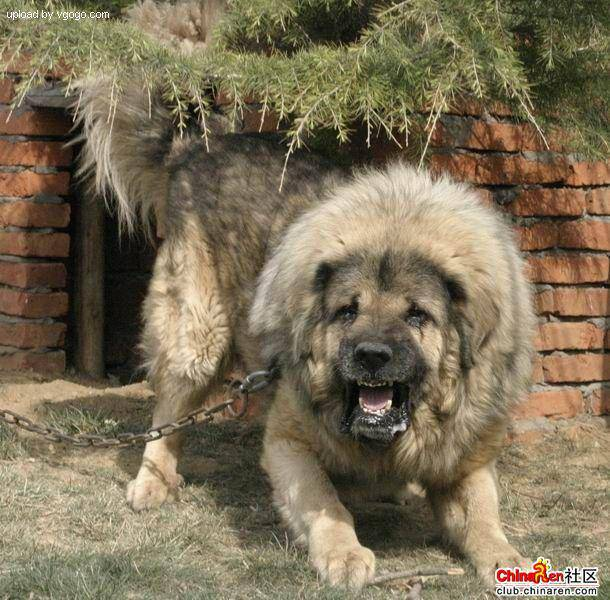

In [12]:
Image(fileNames[9000])

In [13]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since  we've now got our training image filepath in a list, let's prepare our labels.

label is an object type. Remember we have to start converting into numbers. so we use numpy array

In [14]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels) # does same thing as above
labels, len(labels)

(array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
        'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object),
 10222)

In [15]:
# See if number of labels matches with number of filenames

if len(labels) == len(fileNames):
  print("number of labels matches with the number of fileNames")
else:
  print("number of labels does not matches with number of fileNames")

number of labels matches with the number of fileNames


In [16]:
# find the unique labels values

unique_breed = np.unique(labels)
unique_breed,len(unique_breed)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [17]:
# Turn a single label into an array of booleans
print(labels[0])

labels[0] == unique_breed

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Turn every label into boolean array using list comprehension
boolean_labels = [label == unique_breed for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(boolean_labels)

10222

In [20]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breed == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be one where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own Validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [22]:
# Setting up X and y variables
X = fileNames
y = boolean_labels


In [23]:
len(fileNames)

10222

We're going to start off experimentation with ~1000 images and increase as needed.

In [24]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param{type:'slider', min:1000, max:10000, step:1000}

In [25]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# spliting them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state= 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [26]:
# Let's have a gaze at the training data
X_train[:2], y_train[:2]

(['drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## Preprocessing Images (turning images into Tensors)
(Tensors are numerical represenations kind of like a matrix)

To preprocess our images into Tensors we're going to write a function which does a few things:

* Take an image filepath as an input
* Use TensorFlow to read the file and save it to a variable , `image`
* Turn our `image` (a jpg) into Tensors
* Resize the `image` to be a shape of (224,224)
* Return the modified `image`


Before we do let's see what an image looks like.

In [27]:
# Convert an image into numpy
from matplotlib.pyplot import imread
image = imread(fileNames[42])
image.shape

(257, 350, 3)

In [28]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [29]:
# converting a image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [30]:
image2 = imread(fileNames[2])


In [31]:
tf.constant(image2)

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[ 97,  96,  91],
        [102, 101,  96],
        [108, 107, 102],
        ...,
        [ 10,  12,  11],
        [ 10,  12,  11],
        [ 10,  12,  11]],

       [[ 99,  98,  93],
        [102, 101,  96],
        [108, 107, 102],
        ...,
        [ 18,  20,  19],
        [ 18,  20,  19],
        [ 18,  20,  19]],

       [[ 99,  98,  93],
        [ 99,  98,  93],
        [102, 101,  96],
        ...,
        [  8,   8,   8],
        [  8,   8,   8],
        [  8,   8,   8]],

       ...,

       [[193, 192, 188],
        [194, 193, 189],
        [195, 194, 190],
        ...,
        [118, 117, 113],
        [130, 129, 127],
        [128, 127, 123]],

       [[199, 198, 194],
        [200, 199, 195],
        [201, 200, 196],
        ...,
        [116, 115, 110],
        [107, 106, 102],
        [108, 107, 102]],

       [[199, 198, 194],
        [200, 199, 195],
        [202, 201, 197],
        ...,
        [ 96,  96,  8

Now we have seen what an image looks like as a tensor, let's make a function to preprocess them.

1. Take an image filepath as an input
2. Use TensorFlow to read the file and save it to a variable , `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channels values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

In [32]:
# Define image size
IMG_SIZE = 224

def process_image(image_path, img_size= IMG_SIZE):
  """
    Takes the image file path and turn them into Tensors.
  """

  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels= 3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

## Turning our data into batches.

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

so that's why we do 32 (this is batch size) images at a time  (you can manually adjust the batch size if need be).

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which looks like this:
`(image, label)`

In [33]:
# Create a simple function to create a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path name and associated label, process the image and returns the tuple of (image, label)
  '''
  image = process_image(image_path)
  return image, label

In [34]:
# a demo of the above code
print(get_image_label(fileNames[3], tf.constant(boolean_labels[3])))


(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.30236846, 0.29130402, 0.27799872],
        [0.34360996, 0.34351492, 0.3262655 ],
        [0.31875253, 0.32659566, 0.3069878 ],
        ...,
        [0.2709185 , 0.25207576, 0.17392443],
        [0.23924613, 0.2507305 , 0.19066878],
        [0.18908055, 0.21737191, 0.16485092]],

       [[0.28814277, 0.28281814, 0.26759955],
        [0.35677522, 0.3613971 , 0.34178925],
        [0.36211237, 0.3699555 , 0.35034767],
        ...,
        [0.25822112, 0.23287086, 0.16090952],
        [0.17731686, 0.17934492, 0.12220434],
        [0.19765677, 0.21964559, 0.16521132]],

       [[0.31258506, 0.31336036, 0.29532567],
        [0.37555525, 0.3801771 , 0.36056927],
        [0.38585186, 0.40503952, 0.38165018],
        ...,
        [0.27647328, 0.24687381, 0.17775612],
        [0.2189209 , 0.20857166, 0.14858504],
        [0.24111919, 0.2510632 , 0.19903237]],

       ...,

       [[0.49072814, 0.4326049 , 0.37700266],
        [0.4

Now we've got a way to turn our data into tuples of Tensors in the form `(image, label)`, let;s make a functionto turn all of our data `(X & y)` into batches!

In [35]:
# Define the batch size, 32 is a good start

BATCH_SIZE = 32

# Create the function to turn the data into batches
def create_data_batches(X, y=None, batch_size= BATCH_SIZE, valid_data = False, test_data = False):
  '''
  Creates the batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Alse accepts test data as input (no labels)
  '''
  # If the data is test dataset, we probably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is the Valid dataset we don't need to shuffle it
  elif valid_data:
    print('Creating Validation data batches...')
    # Turn the filepath and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...')
    # Turn the filepath and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processorsis faster than shuffling images.
    data = data.shuffle(buffer_size=len(X)) # shuffle all pathnames and label tuple
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch



In [36]:
# Creating training and validation data batches

train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating Validation data batches...


In [37]:
# Check out different attribute of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is in now in batches, however, these can be little hard to understand/comprehand. Let's visualize them!

In [38]:
import matplotlib.pyplot as plt
# Creating a function for viewing images in a data batch

def show_25_images(images, labels):
  """
  Display a plot of 25 images  and their respective labels from a data batch
  """

  # Setting up a figure
  plt.figure(figsize=(10,10))

  # loop through 25 images for displaying  25 images
  for i in range(25):
    #Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5, i+1) # i+1 is the index
    #Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breed[labels[i].argmax()])
    # Turn the gridlines off
    plt.axis("off")

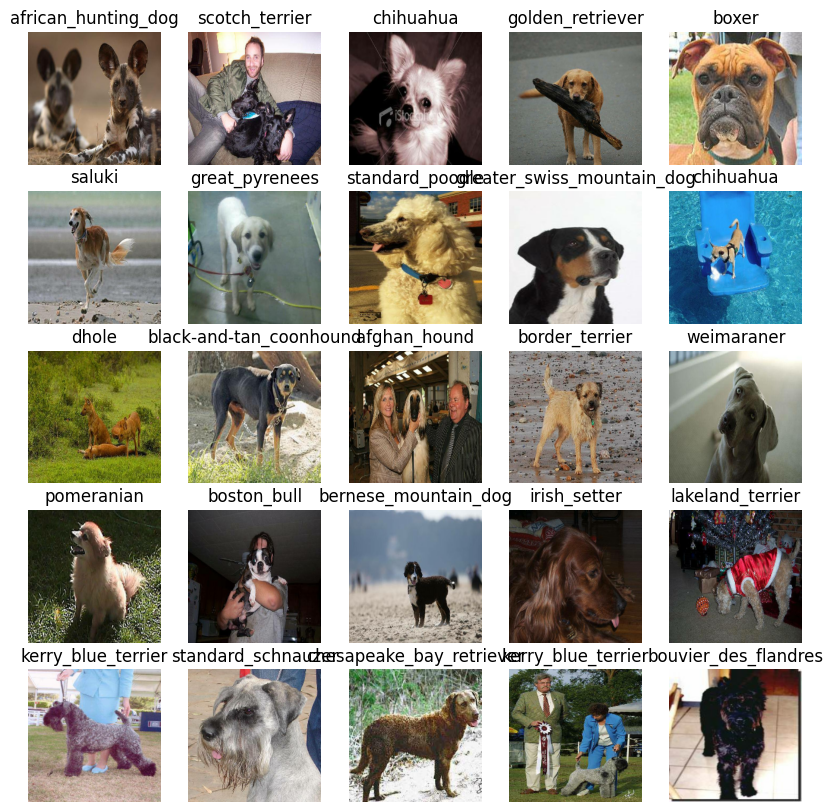

In [39]:
train_images, train_labels = next(train_data.as_numpy_iterator()) #everytime next() runs it will take off the next batch of data
# Let's visualize the data in training batch
show_25_images(images=train_images, labels=train_labels)


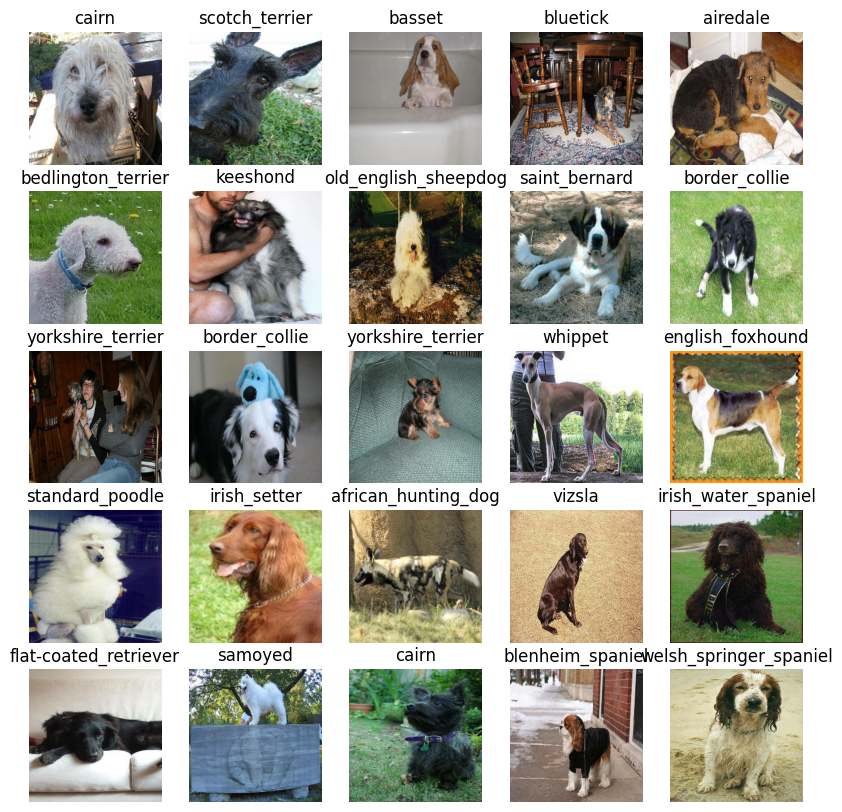

In [40]:
# Let's visualize validation data
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model:

Before we build a model, there are few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) to our model.
* The URL of the model we want to use from Tensorflow Hub - https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification

In [41]:
IMG_SIZE

224

In [42]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, color channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breed)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2"

In [43]:
len(unique_breed)

120

Now we've got our input, output and model ready to go.
Let's put them togather into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameter.
* Define the layers in Keras model in a sequential fashion
(do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Build the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here -https://www.tensorflow.org/guide/keras

In [44]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation='softmax') # Layer 2 (output layer)

  ])

  # Compile the model
  model.compile(
      loss= tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [45]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper function a model can use during training to do such things as save its progress, check it's progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progressand another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To Setup a TensorBoard Callback we need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard Callback which is able to save logs to a directory and pass it to our model's `fit()` function ✅
3. Visualize ouor model training logs with the `%tensorboard` magic funtion (we'll do this after model training)

In [46]:
# Loading TensorBoard notebook extension
%load_ext tensorboard

In [47]:
import datetime

# Create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  # Create a logs directory to save tensorboard logs
  logdir = os.path.join('drive/MyDrive/Colab Notebooks/Dog vision/logs',
                        #Make it so the logs gets tracked whenever we ran an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

Early Stopping helps our model from overfitting by stopping training if a certain evaluation metric stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [48]:
# Creating early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (On subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [49]:
NUM_EPOCHS = 100 #@param{type:'slider', min:10, max:100, step:10}

Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorbaord_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callback we'd like to use.
* Return the model

In [50]:
# Build a function to train and return the trained model

def train_model():
  """
  Trains a given model and returns a trained model.
  """

  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model


In [51]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Epoch 1/100
25/25 [==============================] - 196s 8s/step - loss: 4.5746 - accuracy: 0.1013 - val_loss: 3.5017 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 4s 171ms/step - loss: 1.6393 - accuracy: 0.6875 - val_loss: 2.2150 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 5s 210ms/step - loss: 0.5603 - accuracy: 0.9400 - val_loss: 1.7144 - val_accuracy: 0.5400
Epoch 4/100
25/25 [==============================] - 4s 149ms/step - loss: 0.2506 - accuracy: 0.9875 - val_loss: 1.5436 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 4s 172ms/step - loss: 0.1467 - accuracy: 0.9987 - val_loss: 1.4619 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 5s 178ms/step - loss: 0.1013 - accuracy: 1.0000 - val_loss: 1.4075 - val_accuracy: 0.6350
Epoc

It looks like our model is overfitting as it is doing good on the training data and not performing good on the validation data

## Checking the TensorBoard logs

The TensorBoard magic function `(%tensorboard)` will access the logs directory we created earlier and visualize the content

In [52]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/Dog\ vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating prediction using a trained model

In [53]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [54]:
# make predictions on the validation dataset (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 6s 152ms/step


array([[1.21642207e-03, 4.29548199e-05, 1.17311510e-03, ...,
        8.83708781e-05, 1.48740382e-05, 1.99792488e-03],
       [2.80344929e-03, 1.08123268e-03, 1.78586487e-02, ...,
        4.11700690e-04, 1.15987111e-03, 1.30081011e-04],
       [2.53237590e-06, 2.43211871e-05, 3.38130371e-06, ...,
        2.67806308e-06, 2.23398479e-06, 1.58418459e-07],
       ...,
       [5.65158844e-05, 3.22724925e-04, 1.18916278e-05, ...,
        5.52211986e-06, 2.38459834e-04, 8.41337751e-05],
       [9.37776547e-03, 9.47538501e-05, 1.38264993e-04, ...,
        1.04456914e-04, 5.19983732e-05, 1.01098241e-02],
       [4.67227597e-04, 8.85716781e-06, 4.06993582e-04, ...,
        4.73320205e-03, 1.03770150e-03, 2.55699088e-05]], dtype=float32)

In [55]:
predictions.shape

(200, 120)

In [56]:
#First prediction
index= 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum {np.sum(predictions[index])}")
print(f"Max index {np.argmax(predictions[index])}")
print(f"Predicted label {unique_breed[np.argmax(predictions[index])]}")

[1.21642207e-03 4.29548199e-05 1.17311510e-03 6.43387757e-05
 5.54122635e-05 1.18054240e-05 1.42867249e-02 2.53808626e-04
 4.90349412e-05 3.74326133e-04 2.11493156e-04 2.12584098e-04
 3.71801842e-04 4.70320811e-05 1.69189909e-04 2.61036184e-04
 1.14892728e-05 8.26506540e-02 1.29002065e-05 1.82726399e-05
 3.05644004e-04 2.00210852e-05 2.39871151e-05 3.98754521e-04
 3.48805479e-05 2.98949541e-04 4.82704520e-01 1.18884047e-04
 6.16894045e-04 1.73590175e-04 1.46718201e-04 1.28658357e-04
 1.70310566e-04 4.38581810e-06 1.18738448e-04 6.04312681e-02
 4.27652230e-06 7.04297854e-04 5.94337143e-05 1.90507453e-05
 1.79957846e-04 7.64330798e-06 5.15212123e-05 1.01432277e-04
 2.48809170e-06 1.39394915e-03 3.30248076e-05 2.15593536e-04
 4.53934859e-04 4.00081408e-05 1.80463729e-04 1.70165513e-05
 3.89259832e-04 1.01300131e-04 4.56924754e-05 1.82666743e-04
 3.09715506e-05 6.21138560e-03 9.80737736e-04 1.42206877e-01
 1.70798376e-04 7.63011558e-05 3.98910837e-04 4.59495532e-05
 4.95047207e-05 4.445194

In [57]:
unique_breed[np.argmax(y[0])]

'boston_bull'

Having the above functionality is great but we want to be able to do it at scale.

And it would be better if we could see the image the prediction is made of.

**Note:** Prediction probabilities are also known as confidence levels

In [58]:
# Turn prediction probabilities into their respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breed[np.argmax(prediction_probabilities)]


# Get a predicted label based on the array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [59]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to unbatchfy it to make predictions on the validation images and then compare those predictions to the validation labels (truth label).

In [60]:
# Create a function to unbatch dataset

def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and seperate arrays of images and labels.
  """
  images=[]
  labels=[]

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breed[np.argmax(label)])

  return images, labels

# unbatchify the validation dataset

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have got our ways to get:

* Prediction labels
* Validation labels
* Validation images

Let's make some function to make things a bit more visualize.

We'll create a function which:

* Take a array of prediction probabilities, an array of truth labels, an array of images and an integers ✅
* convert the prediction probabilities into predicted labels ✅
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot ✅

In [61]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for a sample n
  """

  pred_prob , true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title dependeing on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted label, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)


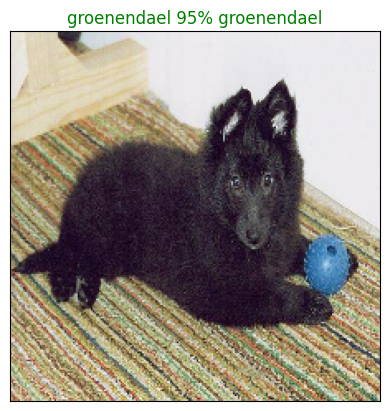

In [62]:
plot_pred(prediction_probabilities= predictions, images= val_images, labels= val_labels, n=77)

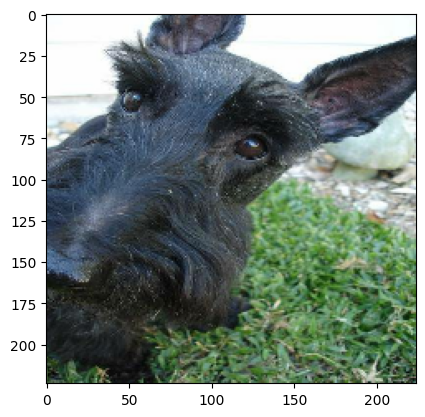

In [63]:
plt.imshow(val_images[1])

NOw we have got one funtion that visulaize our model's top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and ground truth array and an integer ✅

* Find the prediction label using `get_pred_label()` ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probabilities values and labels, colouring the true labels green ✅

In [64]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidence along with the truth label for the sample n.
  """

  pred_prob, truth_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Finding top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breed[top_10_pred_indexes]

  # Setup plot
  top_plot= plt.bar(np.arange(len(top_10_pred_values)),
                    top_10_pred_values,
                    color = 'grey')

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
            rotation='vertical')

  # Change the color of true label
  if np.isin(truth_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == truth_label)].set_color('green')
  else:
    pass



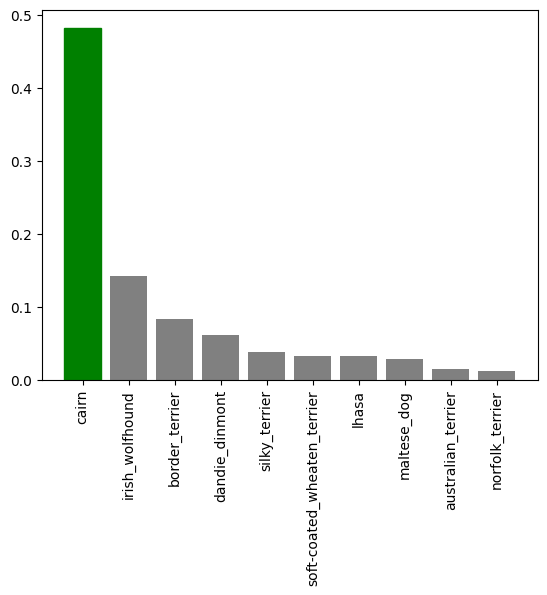

In [65]:
plot_pred_conf(prediction_probabilities= predictions, labels= val_labels, n=0)

In [66]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.48270452, 0.14220688, 0.08265065, 0.06043127, 0.03790386,
       0.03264068, 0.03242622, 0.02758721, 0.01428672, 0.01230512],
      dtype=float32)

Now we've got some function to visualize our predictions and evaluate our model, let's check out a few.

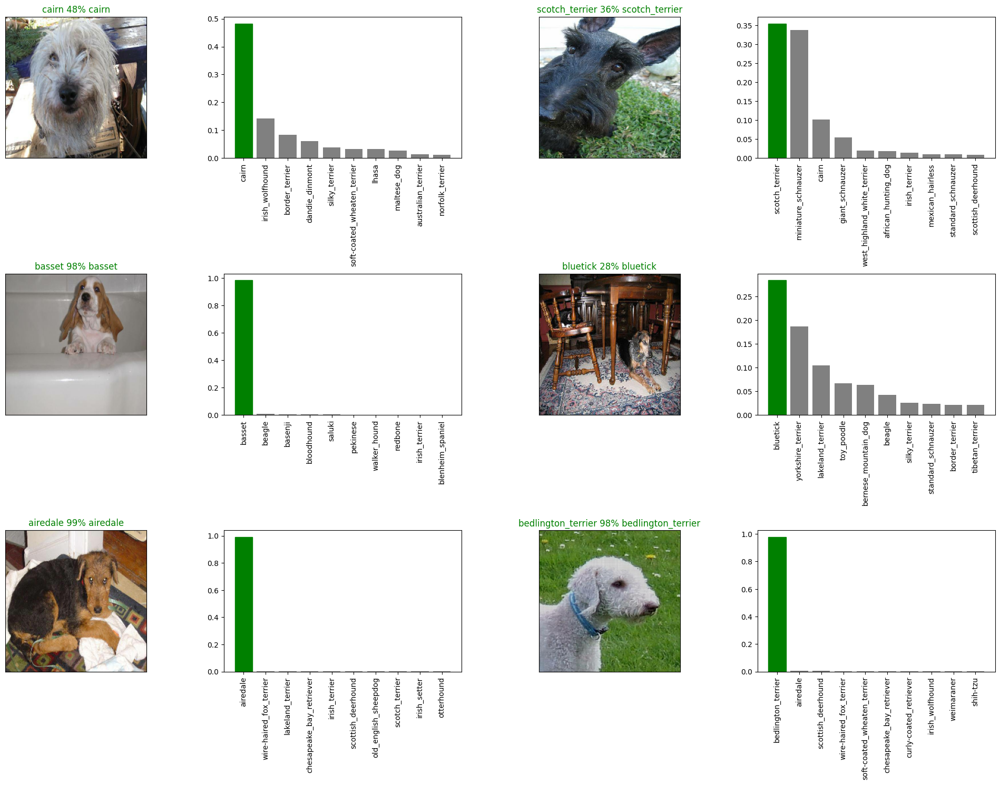

In [67]:
# Let's check out a few prediction and their differet values
i_multiplier = 0
num_rows = 3
num_columns = 2
num_images= num_rows * num_columns
plt.figure(figsize = (10*num_columns, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2*num_columns, 2*i+1)
  plot_pred(prediction_probabilities= predictions, labels= val_labels, images = val_images, n= i+i_multiplier)
  plt.subplot(num_rows, 2*num_columns, 2*i+2)
  plot_pred_conf(prediction_probabilities= predictions, labels= val_labels, n=i+i_multiplier)

plt.tight_layout(h_pad = 1.0)
plt.show()

## Saving and Reloading a Trained Model.

In [69]:
# Create a function to save a model.

def save_model(model, suffix=None):
  """
  Saves a given model in models directory and append a suffix (string).
  """

  # Create a model directory pathname with current time.
  modeldir = os.path.join('drive/MyDrive/Colab Notebooks/Dog vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix +'.h5' #save format of model
  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path


In [74]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Now we've got functions to load and save model let's make sure they works.

In [72]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenet-v2-Adam")

Saving model to drive/MyDrive/Colab Notebooks/Dog vision/models/20240129-17121706548332-1000-images-mobilenet-v2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Colab Notebooks/Dog vision/models/20240129-17121706548332-1000-images-mobilenet-v2-Adam.h5'

In [75]:
loaded_1000_image_model = load_model('drive/MyDrive/Colab Notebooks/Dog vision/models/20240129-17121706548332-1000-images-mobilenet-v2-Adam.h5')

Loading saved model from drive/MyDrive/Colab Notebooks/Dog vision/models/20240129-17121706548332-1000-images-mobilenet-v2-Adam.h5


In [76]:
#Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 154ms/step - loss: 1.2578 - accuracy: 0.6750


[1.257847547531128, 0.675000011920929]

In [77]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 137ms/step - loss: 1.2578 - accuracy: 0.6750


[1.257847547531128, 0.675000011920929]

## Trianing a bog dog model (on the full data)

In [78]:
len(X), len(y)

(10222, 10222)

In [79]:
len(X_train)

800

In [80]:
len(y_train)

800

In [82]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [83]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [84]:
# Create a model for full model

full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2


In [85]:
# Create full model callbacks
full_model_tensorboard_callback = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**Note"** Running the below cell will take a little while(maybe upto 30 mins for the first epoch) Because GPU we are using in the runtime has to load all the images into memory.

In [89]:
# Fitting the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard_callback, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 54s 166ms/step - loss: 0.2354 - accuracy: 0.9350
Epoch 2/100
320/320 [==============================] - 49s 152ms/step - loss: 0.1529 - accuracy: 0.9632
Epoch 3/100
320/320 [==============================] - 45s 140ms/step - loss: 0.1063 - accuracy: 0.9799
Epoch 4/100
320/320 [==============================] - 46s 144ms/step - loss: 0.0774 - accuracy: 0.9870
Epoch 5/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0574 - accuracy: 0.9922
Epoch 6/100
320/320 [==============================] - 46s 142ms/step - loss: 0.0469 - accuracy: 0.9934
Epoch 7/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0375 - accuracy: 0.9961
Epoch 8/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0300 - accuracy: 0.9975
Epoch 9/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0268 - accuracy: 0.9977
Epoch 10/100
320/320 [==============================] - 44s 137m

In [99]:
save_model(full_model, suffix='full-image-set-mobilenet-v2-Adam')

Saving model to drive/MyDrive/Colab Notebooks/Dog vision/models/20240129-18461706553988-full-image-set-mobilenet-v2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Colab Notebooks/Dog vision/models/20240129-18461706553988-full-image-set-mobilenet-v2-Adam.h5'

In [100]:
# Load a model
loaded_full_model = load_model('drive/MyDrive/Colab Notebooks/Dog vision/models/20240129-18461706553988-full-image-set-mobilenet-v2-Adam.h5')

Loading saved model from drive/MyDrive/Colab Notebooks/Dog vision/models/20240129-18461706553988-full-image-set-mobilenet-v2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of tensor batches, to make predictions on the test data, we'll have to convert our test data into the same format.

Luckily we've created `create_data_batches()` function which can take a list of filenames as input and convert them into Tensor Batches.

To make predictions on the test data:
* Get the test images filename ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True`  (Since the test data does not have labels) ✅
* Make predictions array by passing the test batches to the `predict()` method called on our model.

In [102]:
# Load the test images filenames
test_path = 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/test/'

test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog vision/Dataset/test/f414cc74bc9df7c993ca72c5ac986846.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/test/e8e68264f76c3398ecb6c67b9bb52833.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/test/ed675fae47e3a3698277131065548e2f.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/test/efa05bbbd2e169dc723df1a43ff0e1bb.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/test/eb61a828e939eb633c1811f283d15647.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/test/f02444318adc0c1c2360c3bf3bff5709.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/test/e92e6f99e804a6696cf0db266bbd7744.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/test/f367afa19bb30234fafa16c64b3730f0.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/test/ebf7096a543da53b1e4759753aedad26.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/test/e8889cf9d7b2701a85be1c97661b9b26.jpg']

In [93]:
len(test_filenames)

10357

In [103]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [104]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run.

In [105]:
# Making preditcions on the test data batch using the loaded full model
test_preds = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 261s 786ms/step


In [106]:
# save predictions
np.savetxt('drive/MyDrive/Colab Notebooks/Dog vision/preds_array.csv', test_preds, delimiter=',')

In [108]:
# Load predictions
test_predictions = np.loadtxt('drive/MyDrive/Colab Notebooks/Dog vision/preds_array.csv', delimiter=',')

In [112]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our model predictions probability outputs in a DataFrame with an ID and a column for each different dog breed.
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed ✅
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction pribabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle.

In [114]:
# Create a DF with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breed))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [124]:
# Append test image ID's to predictions dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [120]:
# print(os.listdir(test_path))

['f414cc74bc9df7c993ca72c5ac986846.jpg', 'e8e68264f76c3398ecb6c67b9bb52833.jpg', 'ed675fae47e3a3698277131065548e2f.jpg', 'efa05bbbd2e169dc723df1a43ff0e1bb.jpg', 'eb61a828e939eb633c1811f283d15647.jpg', 'f02444318adc0c1c2360c3bf3bff5709.jpg', 'e92e6f99e804a6696cf0db266bbd7744.jpg', 'f367afa19bb30234fafa16c64b3730f0.jpg', 'ebf7096a543da53b1e4759753aedad26.jpg', 'e8889cf9d7b2701a85be1c97661b9b26.jpg', 'ee345e7f5ac2d3cf979a17183437faa7.jpg', 'f31ed6141b0976f85aaef9b69509c939.jpg', 'e9c38696d381e66971cc328e767fad27.jpg', 'f080ee2429dccf56d2693fb8d3235010.jpg', 'f0ceb5eb780eba366f9a077486fe003d.jpg', 'ecab3cabdfabe8663ab388e891afdbed.jpg', 'eda4465ceee576ac15e9bba9566c9121.jpg', 'ebf3e1d5583ceff0a51a8c6a750b367b.jpg', 'ea54171754dc00a910fd4ed0cb41e765.jpg', 'f56080803871563e96541a57ad1a08c4.jpg', 'eadffa2af96b121d7e61dcd91ab11a39.jpg', 'ec25ce11616bda2e8b7669c415128768.jpg', 'f46c9b6ddea9aa7ff685604eec44f67a.jpg', 'ec2a07ae6eaa64dac4154584ef229937.jpg', 'e93e61b16ed9e22d35046ae7900b0647.jpg',

In [126]:
# appending prediction data to every column
preds_df[list(unique_breed)] = test_predictions

In [127]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f414cc74bc9df7c993ca72c5ac986846,2.373947e-13,5.589681e-14,6.285922e-09,3.998835e-11,7.346531e-14,1.230026e-13,3.466586e-07,9.090323e-10,5.634242e-10,...,4.040008e-12,1.321423e-10,5.770652e-13,1.387944e-14,1.300123e-14,1.638589e-10,1.061107e-11,2.333011e-11,1.263619e-11,1.325518e-14
1,e8e68264f76c3398ecb6c67b9bb52833,7.320633e-11,1.959538e-12,2.933434e-09,1.224997e-12,1.958720e-08,4.339918e-09,2.517992e-09,3.024759e-05,5.894362e-09,...,6.878906e-08,9.403453e-06,3.467713e-10,6.121975e-11,2.257190e-10,9.135053e-11,2.420300e-10,1.145380e-09,8.990898e-09,6.859972e-12
2,ed675fae47e3a3698277131065548e2f,1.850695e-11,1.973510e-08,4.620499e-08,1.499834e-11,6.969257e-06,6.558787e-09,1.410574e-11,1.719637e-07,2.413268e-08,...,6.527239e-09,5.352422e-07,1.172659e-04,2.323000e-08,5.679433e-11,6.652308e-13,1.659123e-11,8.933803e-05,2.932712e-09,3.703191e-08
3,efa05bbbd2e169dc723df1a43ff0e1bb,3.187697e-09,1.434809e-08,4.687864e-11,2.180407e-05,2.796740e-06,8.053196e-07,1.569597e-03,4.347156e-08,1.030840e-08,...,4.020491e-09,2.522955e-06,5.855194e-09,7.880979e-07,1.829603e-11,2.650274e-10,2.115579e-07,1.601589e-08,2.659579e-08,5.009250e-07
4,eb61a828e939eb633c1811f283d15647,2.057753e-11,1.535381e-09,4.020741e-11,3.811953e-09,1.067908e-09,1.261936e-11,5.982671e-09,3.656467e-07,9.995327e-01,...,5.275475e-11,3.519899e-11,7.908989e-09,3.926543e-06,1.604743e-10,3.530468e-06,5.354052e-09,1.176670e-09,7.962468e-08,3.861689e-11


In [131]:
# Saving our dataframe to CSV for submission to Kaggle
preds_df.to_csv('/content/drive/MyDrive/Colab Notebooks/Dog vision/full_model_predictions_submmission_1_mobilenet_V2.csv',
                index=False)

## Making predictions on Custom Images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()` and since it does not have labels so `test_data` is `True`
* We pass the custom image data batch to our model's `predict()` method.
* Convert prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [132]:
# Get custom image filepaths
custom_path = 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/my-dog-images/'
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [133]:
custom_image_path

['drive/MyDrive/Colab Notebooks/Dog vision/Dataset/my-dog-images/dog1.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/Dataset/my-dog-images/dog2.jpg']

In [134]:
# Turn the custom images into data batches
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [136]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 661ms/step


In [138]:
custom_preds.shape

(2, 120)

In [144]:
# Get custom image prediction labels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['labrador_retriever', 'cardigan']

In [145]:
# Get custom images.... Unbatchify won't worl because we don't have labels

custom_images = []
# Loop through unbatched data
for images in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(images)

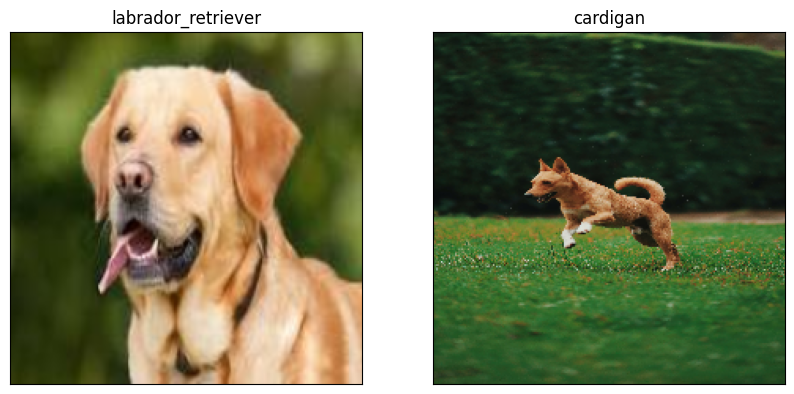

In [147]:
# Check custom images predictions
plt.figure(figsize=(10,10))

for i, image in enumerate(custom_images):
  plt.subplot(1, 2 , i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)
